In [9]:
import sys
import time
import logging
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tf_pose import common
from tf_pose.estimator import TfPoseEstimator, Human
from tf_pose.networks import get_graph_path, model_wh

In [10]:
def plot_img(image, axis=False, grid=False, showBG = True):
    plt.figure(figsize=(15,8))
    if showBG:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image);
    if grid == True:
        plt.grid();
    if axis == False:       
        plt.axis('off');

In [11]:
def get_human_pose(image_path, showBG = True):
    image = common.read_imgfile(image_path, None, None)
  
    if image is None:
        logger.error('Image can not be read, path=%s' % image)
        sys.exit(-1)

    t = time.time()
    
    humans = e.inference(image, resize_to_default=(w > 0 and h > 0), upsample_size=4.0)
    elapsed = time.time() - t

    #logger.info('inference image: %s in %.4f seconds.' % (image, elapsed))
    if showBG == False:
        image = np.zeros(image.shape)
    image = TfPoseEstimator.draw_humans(image, humans, imgcopy=False)
    return image, humans

In [12]:
def show_heatmap(image):
    bgimg = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_BGR2RGB)
    bgimg = cv2.resize(bgimg, (e.heatMat.shape[1], e.heatMat.shape[0]), interpolation=cv2.INTER_AREA)

    plt.figure(figsize=(15,8))
    plt.imshow(bgimg, alpha=0.5)
    tmp = np.amax(e.heatMat[:, :, :-1], axis=2)
    plt.imshow(tmp, cmap=plt.cm.gray, alpha=0.5)
    plt.colorbar()
    plt.axis('off');

In [13]:
def show_vectormaps(image):
    tmp2 = e.pafMat.transpose((2, 0, 1))
    tmp2_odd = np.amax(np.absolute(tmp2[::2, :, :]), axis=0)
    tmp2_even = np.amax(np.absolute(tmp2[1::2, :, :]), axis=0)
    
    fig = plt.figure(figsize=(20,15))

    a = fig.add_subplot(2, 2, 3)
    a.set_title('Vectormap-x')
    # plt.imshow(CocoPose.get_bgimg(inp, target_size=(vectmap.shape[1], vectmap.shape[0])), alpha=0.5)
    plt.imshow(tmp2_odd, cmap=plt.cm.gray, alpha=0.5)
    plt.colorbar()

    a = fig.add_subplot(2, 2, 4)
    a.set_title('Vectormap-y')
    # plt.imshow(CocoPose.get_bgimg(inp, target_size=(vectmap.shape[1], vectmap.shape[0])), alpha=0.5)
    plt.imshow(tmp2_even, cmap=plt.cm.gray, alpha=0.5)
    plt.colorbar()
    plt.show()

In [14]:
def show_keypoints(image, hum, human=1, color='orange', showBG = True):
    if human == 0: human = 1
    num_hum = len(hum)
    keypoints = str(str(str(hum[human-1]).split('BodyPart:')[1:]).split('-')).split(' score=')
    keypoints_list=[]
    for i in range (len(keypoints)-1): 
        pnt = keypoints[i][-11:-1]
        pnt = tuple(map(float, pnt.split(', ')))
        keypoints_list.append(pnt)

    keypts_array = np.array(keypoints_list)
    keypts_array = keypts_array*(image.shape[1],image.shape[0])
    keypts_array = keypts_array.astype(int)
    keypts_array

    plt.figure(figsize=(10,10))
    plt.axis([0, image.shape[1], 0, image.shape[0]])  
    plt.scatter(*zip(*keypts_array), s=200, color=color, alpha=0.6)
    if showBG:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)      
    plt.imshow(image)
    ax=plt.gca() 
    ax.set_ylim(ax.get_ylim()[::-1]) 
    ax.xaxis.tick_top() 
    plt.title('Keypoints Person [{}] from {} humans detected\n'.format(human, num_hum))
    plt.grid();

    for i, txt in enumerate(keypts_array):
        ax.annotate(i, (keypts_array[i][0]-5, keypts_array[i][1]+5))
            
    return keypts_array

In [15]:
logger = logging.getLogger('TfPoseEstimatorRun')
logger.handlers.clear()
logger.setLevel(logging.DEBUG)
ch = logging.StreamHandler()
ch.setLevel(logging.DEBUG)
formatter = logging.Formatter('[%(asctime)s] [%(name)s] [%(levelname)s] %(message)s')
ch.setFormatter(formatter)
logger.addHandler(ch)

In [16]:
model='mobilenet_thin'
resize='432x368'
w, h = model_wh(resize)
if w == 0 or h == 0:
    e = TfPoseEstimator(get_graph_path(model), target_size=(432, 368))
else:
    e = TfPoseEstimator(get_graph_path(model), target_size=(w, h))

[2021-03-01 15:21:08,127] [TfPoseEstimator] [INFO] loading graph from C:\Users\sukri\Desktop\Myopenpose\tf-pose-estimation\models\graph/mobilenet_thin/graph_opt.pb(default size=432x368)
2021-03-01 15:21:08,127 INFO loading graph from C:\Users\sukri\Desktop\Myopenpose\tf-pose-estimation\models\graph/mobilenet_thin/graph_opt.pb(default size=432x368)


MobilenetV1/Conv2d_0/weights
image
MobilenetV1/Conv2d_0/Conv2D
MobilenetV1/Conv2d_0/Conv2D_bn_offset
MobilenetV1/Conv2d_0/BatchNorm/FusedBatchNorm
MobilenetV1/Conv2d_0/Relu
MobilenetV1/Conv2d_1_depthwise/depthwise_weights
MobilenetV1/Conv2d_1_pointwise/weights
MobilenetV1/Conv2d_1_depthwise/depthwise
MobilenetV1/Conv2d_1_pointwise/Conv2D
MobilenetV1/Conv2d_1_pointwise/Conv2D_bn_offset
MobilenetV1/Conv2d_1_pointwise/BatchNorm/FusedBatchNorm
MobilenetV1/Conv2d_1_pointwise/Relu
MobilenetV1/Conv2d_2_depthwise/depthwise_weights
MobilenetV1/Conv2d_2_pointwise/weights
MobilenetV1/Conv2d_2_depthwise/depthwise
MobilenetV1/Conv2d_2_pointwise/Conv2D
MobilenetV1/Conv2d_2_pointwise/Conv2D_bn_offset
MobilenetV1/Conv2d_2_pointwise/BatchNorm/FusedBatchNorm
MobilenetV1/Conv2d_2_pointwise/Relu
MobilenetV1/Conv2d_3_depthwise/depthwise_weights
MobilenetV1/Conv2d_3_pointwise/weights
MobilenetV1/Conv2d_3_depthwise/depthwise
MobilenetV1/Conv2d_3_pointwise/Conv2D
MobilenetV1/Conv2d_3_pointwise/Conv2D_bn_offse

KeyError: "The name 'TfPoseEstimator/image:0' refers to a Tensor which does not exist. The operation, 'TfPoseEstimator/image', does not exist in the graph."

In [17]:
facee = Human

In [19]:
!ls ./images

'ls' is not recognized as an internal or external command,
operable program or batch file.


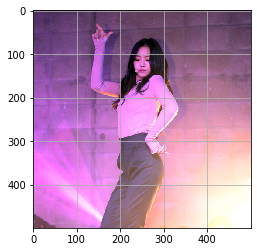

In [20]:
image_path = './images/apink1_crop.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.grid();

In [21]:
image.shape

(500, 500, 3)

In [22]:
image = common.read_imgfile(image_path, None, None)

In [23]:
image.shape

(500, 500, 3)

In [24]:
humans = e.inference(image, resize_to_default=(w > 0 and h > 0), upsample_size=4.0)

NameError: name 'e' is not defined

In [25]:
e.heatMat.shape

NameError: name 'e' is not defined

In [33]:
e.heatMat[0][0]

array([ 6.1202771e-04, -2.1935217e-03,  3.1645093e-03,  4.3006055e-04,
        1.9456716e-03,  3.6615245e-03,  1.6516596e-03, -9.3726283e-03,
        5.9889369e-03, -3.0205427e-03, -3.3548176e-03,  1.7745085e-03,
        2.3460519e-03, -7.9026818e-04, -1.5300512e-03, -6.4139217e-03,
        6.8136360e-03, -6.1720591e-03,  9.9912471e-01], dtype=float32)

In [34]:
e.heatMat[0][0][18]

0.9991247

In [35]:
e.heatMat[37][108]

array([ 2.8641635e-01,  2.7726186e-03,  4.2631975e-03, -9.7310706e-04,
        5.8994594e-04,  1.6486193e-03, -2.5285324e-03,  2.0559346e-03,
        9.6321506e-03,  7.8021898e-04, -2.3937039e-04,  6.8865088e-04,
        7.1994779e-03, -1.5910110e-04,  3.1697184e-01,  4.9623349e-01,
        1.8246224e-02,  2.4408199e-02,  4.1538566e-01], dtype=float32)

In [36]:
e.heatMat[37][108].max()

0.4962335

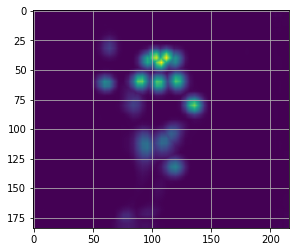

In [37]:
max_prob = np.amax(e.heatMat[:, :, :-1], axis=2)
plt.imshow(max_prob)
plt.grid();

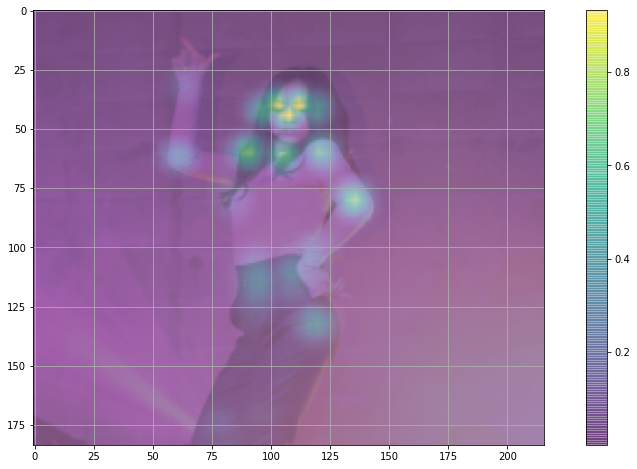

In [38]:
plt.figure(figsize=(15,8))
bgimg = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_BGR2RGB)
bgimg = cv2.resize(bgimg, (e.heatMat.shape[1], e.heatMat.shape[0]), interpolation=cv2.INTER_AREA)
plt.imshow(bgimg, alpha=0.5)
plt.imshow(max_prob, alpha=0.5)
plt.colorbar()
plt.grid();

In [39]:
e.pafMat.shape

(184, 216, 38)

In [40]:
e.pafMat.transpose((2, 0, 1)).shape

(38, 184, 216)

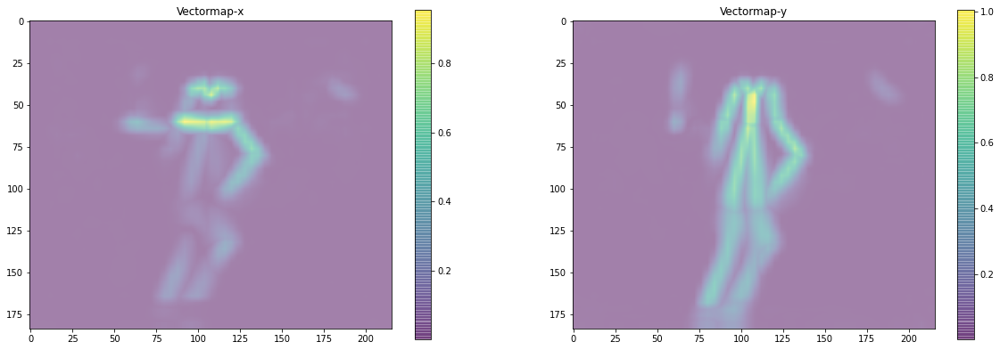

In [41]:
tmp2 = e.pafMat.transpose((2, 0, 1))
tmp2_odd = np.amax(np.absolute(tmp2[::2, :, :]), axis=0)
tmp2_even = np.amax(np.absolute(tmp2[1::2, :, :]), axis=0)

fig = plt.figure(figsize=(20,15))

a = fig.add_subplot(2, 2, 3)
a.set_title('Vectormap-x')
plt.imshow(tmp2_odd, alpha=0.5)
plt.colorbar()

a = fig.add_subplot(2, 2, 4)
a.set_title('Vectormap-y')
plt.imshow(tmp2_even, alpha=0.5)
plt.colorbar()
plt.show()

In [42]:
image = TfPoseEstimator.draw_humans(image, humans, imgcopy=False)

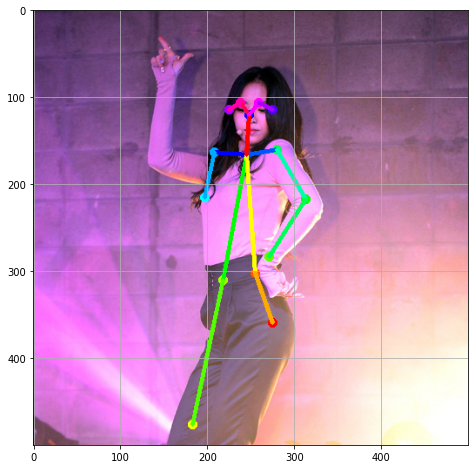

In [54]:
plot_img(image, axis=True, grid=True)

2021-02-27 16:26:27,959 WARNING Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


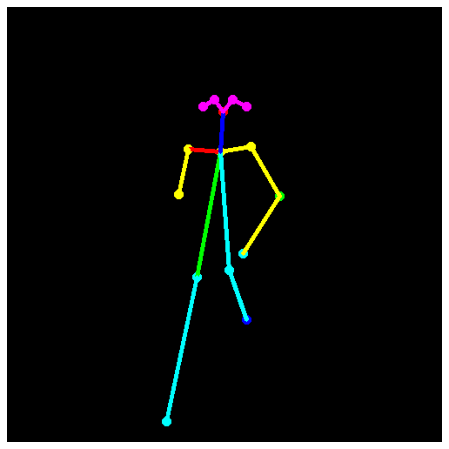

In [55]:
image = common.read_imgfile(image_path, None, None)
humans = e.inference(image, resize_to_default=(w > 0 and h > 0), upsample_size=4.0)
black_background = np.zeros(image.shape)
skeleton = TfPoseEstimator.draw_humans(black_background, humans, imgcopy=False)
plt.figure(figsize=(15,8))
plt.imshow(skeleton);
plt.grid();      
plt.axis('off');

Getting the Keypoints (Joints) coordinates


In [56]:
humans

[BodyPart:0-(0.50, 0.24) score=0.88 BodyPart:1-(0.49, 0.33) score=0.63 BodyPart:2-(0.42, 0.33) score=0.72 BodyPart:3-(0.39, 0.43) score=0.17 BodyPart:5-(0.56, 0.32) score=0.63 BodyPart:6-(0.62, 0.43) score=0.72 BodyPart:7-(0.54, 0.57) score=0.28 BodyPart:8-(0.44, 0.62) score=0.33 BodyPart:9-(0.37, 0.95) score=0.11 BodyPart:11-(0.51, 0.60) score=0.31 BodyPart:12-(0.55, 0.72) score=0.40 BodyPart:14-(0.48, 0.21) score=0.79 BodyPart:15-(0.52, 0.21) score=0.87 BodyPart:16-(0.45, 0.23) score=0.54 BodyPart:17-(0.55, 0.23) score=0.43]

In [57]:
keypoints = str(str(str(humans[0]).split('BodyPart:')[1:]).split('-')).split(' score=')
len(keypoints)

16

In [58]:
keypoints_list=[]
for i in range (len(keypoints)-1): 
    pnt = keypoints[i][-11:-1]
    pnt = tuple(map(float, pnt.split(', ')))
    keypoints_list.append(pnt)

In [59]:
keypoints_list

[(0.5, 0.24),
 (0.49, 0.33),
 (0.42, 0.33),
 (0.39, 0.43),
 (0.56, 0.32),
 (0.62, 0.43),
 (0.54, 0.57),
 (0.44, 0.62),
 (0.37, 0.95),
 (0.51, 0.6),
 (0.55, 0.72),
 (0.48, 0.21),
 (0.52, 0.21),
 (0.45, 0.23),
 (0.55, 0.23)]

In [60]:
keypts_array = np.array(keypoints_list)
keypts_array = keypts_array*(image.shape[1],image.shape[0])
keypts_array = keypts_array.astype(int)
keypts_array

array([[250, 120],
       [245, 165],
       [210, 165],
       [195, 215],
       [280, 160],
       [310, 215],
       [270, 285],
       [220, 310],
       [185, 475],
       [255, 300],
       [275, 360],
       [240, 105],
       [260, 105],
       [225, 115],
       [275, 115]])

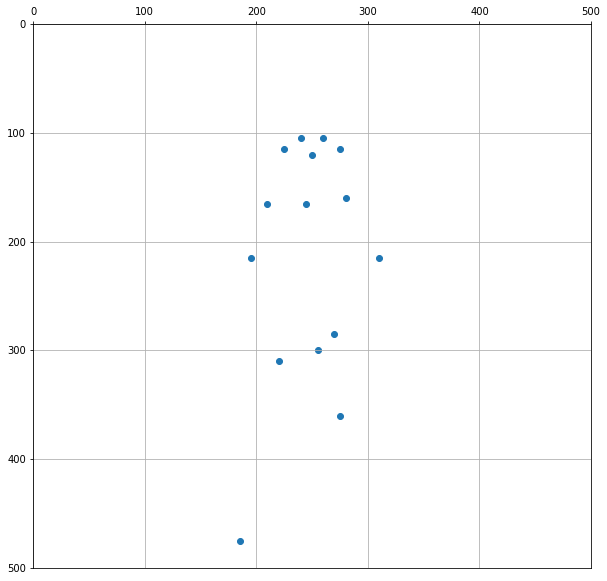

In [61]:
plt.figure(figsize=(10,10))
plt.axis([0, image.shape[1], 0, image.shape[0]])  
plt.scatter(*zip(*keypts_array))
ax=plt.gca() 
ax.set_ylim(ax.get_ylim()[::-1]) 
ax.xaxis.tick_top() 
plt.grid();

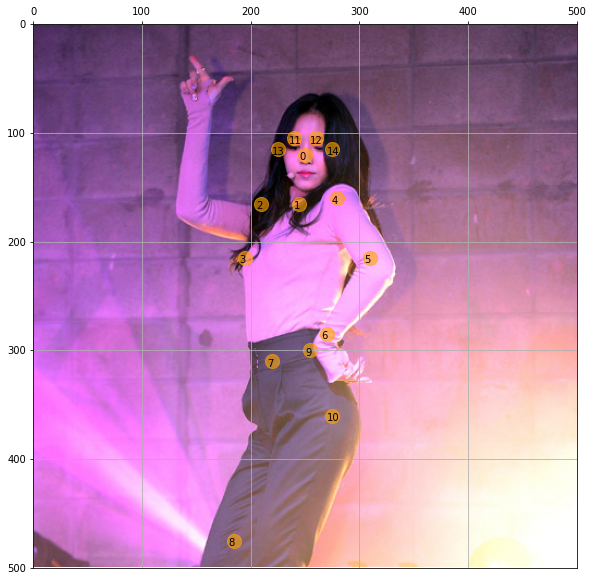

In [62]:
plt.figure(figsize=(10,10))
plt.axis([0, image.shape[1], 0, image.shape[0]])  
plt.scatter(*zip(*keypts_array), s=200, color='orange', alpha=0.6)
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(img)
ax=plt.gca() 
ax.set_ylim(ax.get_ylim()[::-1]) 
ax.xaxis.tick_top() 
plt.grid();

for i, txt in enumerate(keypts_array):
    ax.annotate(i, (keypts_array[i][0]-5, keypts_array[i][1]+5))

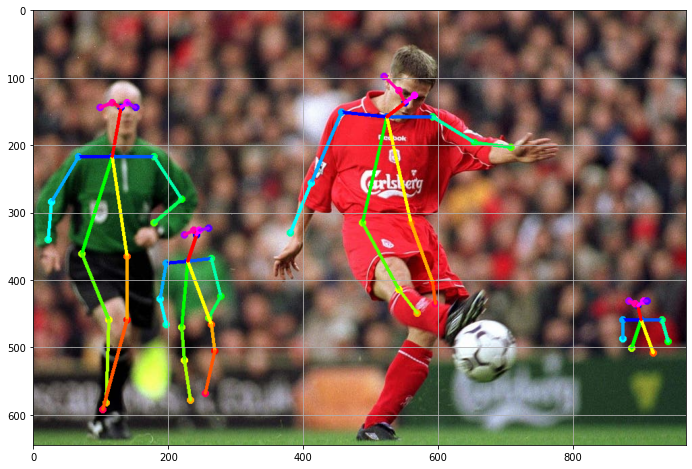

In [66]:
image_path = './images/111.jpg'
img, hum = get_human_pose(image_path, showBG = True)
plot_img(img, axis=True, grid=True)

2021-02-27 16:30:26,479 WARNING Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


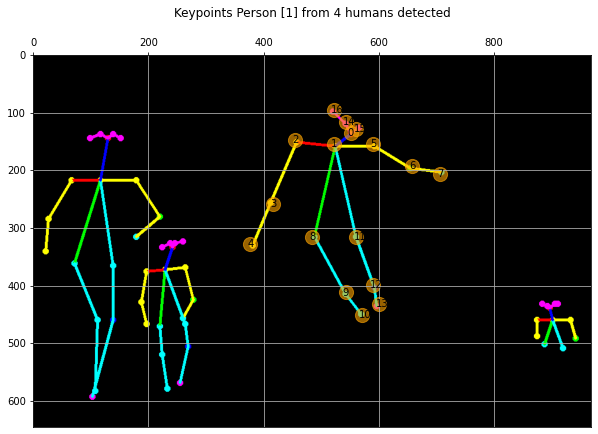

In [67]:
image_path = './images/111.jpg'
img, hum = get_human_pose(image_path, showBG=False)
keypoints = show_keypoints(img, hum, showBG=False)

In [68]:
keypoints

array([[551, 135],
       [522, 154],
       [454, 148],
       [416, 258],
       [377, 328],
       [590, 154],
       [658, 193],
       [706, 206],
       [484, 316],
       [542, 412],
       [571, 451],
       [561, 316],
       [590, 399],
       [600, 432],
       [542, 116],
       [561, 129],
       [522,  96]])

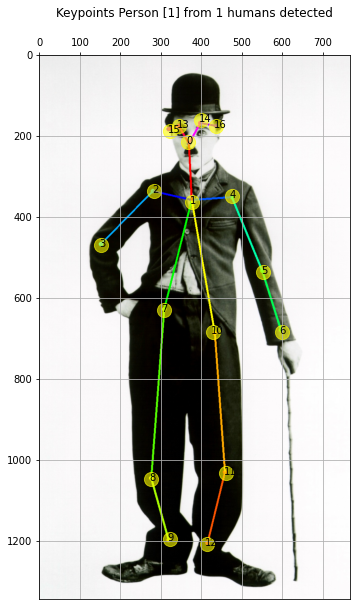

In [76]:
image_path = './images/charlie-chaplin.jpg'
img, hum = get_human_pose(image_path)
keypoints = show_keypoints(img, hum, human=0, color='yellow')

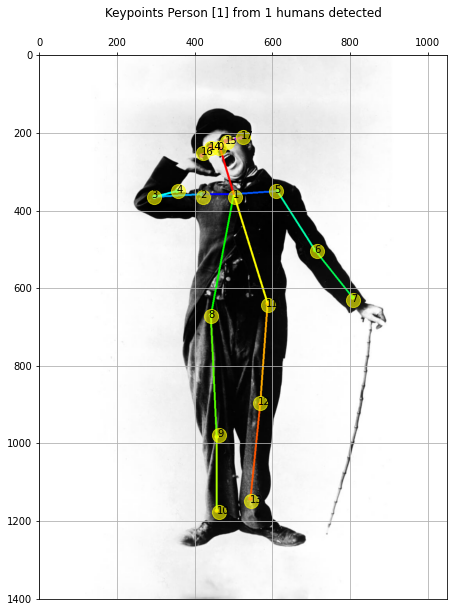

In [77]:
image_path = './images/Charlie_Chaplin.jpg'
img, hum = get_human_pose(image_path)
keypoints = show_keypoints(img, hum, color='yellow')

2021-02-27 16:38:16,348 WARNING Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


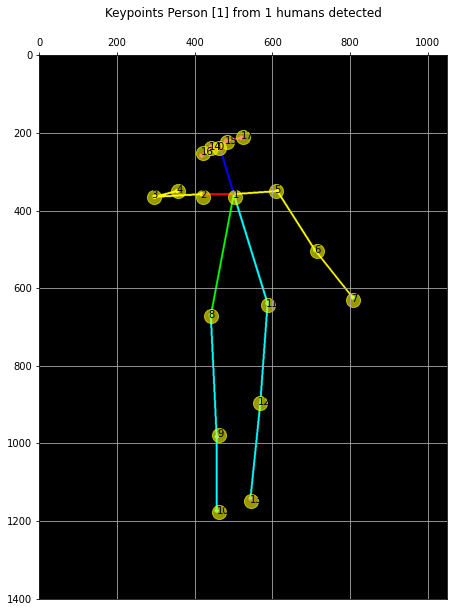

In [78]:
image_path = './images/Charlie_Chaplin.jpg'
img, hum = get_human_pose(image_path, showBG=False)
keypoints = show_keypoints(img, hum, color='yellow', showBG=False)

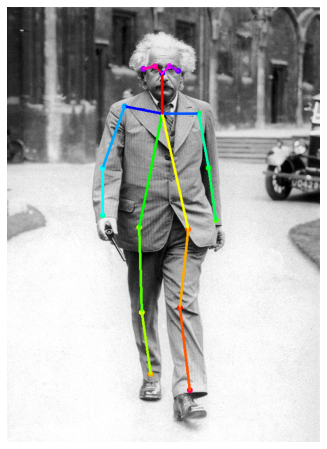

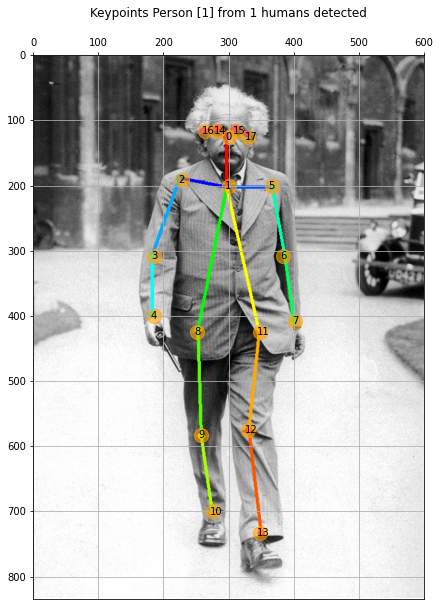

In [79]:
image_path = './images/einstein_oxford.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=False, grid=False)
keypoints = show_keypoints(img, hum)

2021-02-27 16:38:33,790 WARNING Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


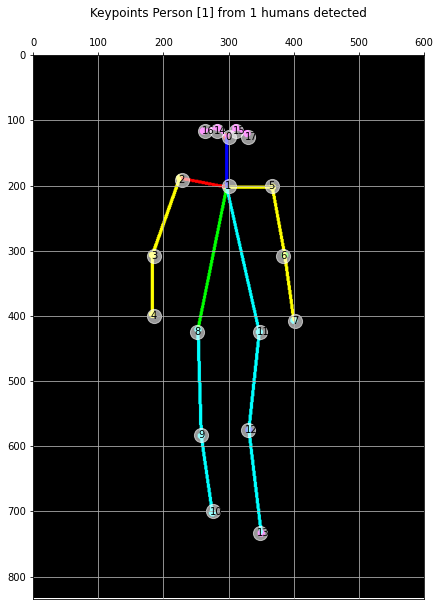

In [80]:
img, hum = get_human_pose(image_path, showBG=False)
keypoints = show_keypoints(img, hum, color='white', showBG=False)

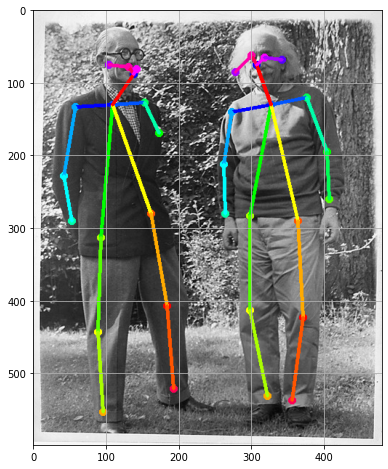

In [82]:
image_path = './images/Einstein_Le_Corbusier_Princeton_1946.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=True, grid=True)

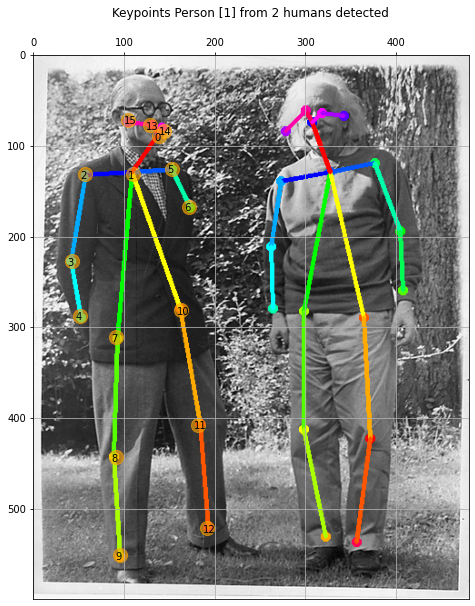

In [83]:
keypoints_1 = show_keypoints(img, hum, 1)

In [84]:
hum[1]

BodyPart:0-(0.64, 0.12) score=0.67 BodyPart:1-(0.68, 0.22) score=0.64 BodyPart:2-(0.57, 0.23) score=0.59 BodyPart:3-(0.55, 0.35) score=0.56 BodyPart:4-(0.55, 0.47) score=0.66 BodyPart:5-(0.78, 0.20) score=0.58 BodyPart:6-(0.84, 0.33) score=0.55 BodyPart:7-(0.85, 0.43) score=0.67 BodyPart:8-(0.62, 0.47) score=0.41 BodyPart:9-(0.62, 0.69) score=0.49 BodyPart:10-(0.67, 0.89) score=0.41 BodyPart:11-(0.76, 0.48) score=0.37 BodyPart:12-(0.77, 0.71) score=0.50 BodyPart:13-(0.74, 0.90) score=0.43 BodyPart:14-(0.62, 0.10) score=0.69 BodyPart:15-(0.66, 0.11) score=0.73 BodyPart:16-(0.58, 0.14) score=0.29 BodyPart:17-(0.71, 0.11) score=0.58

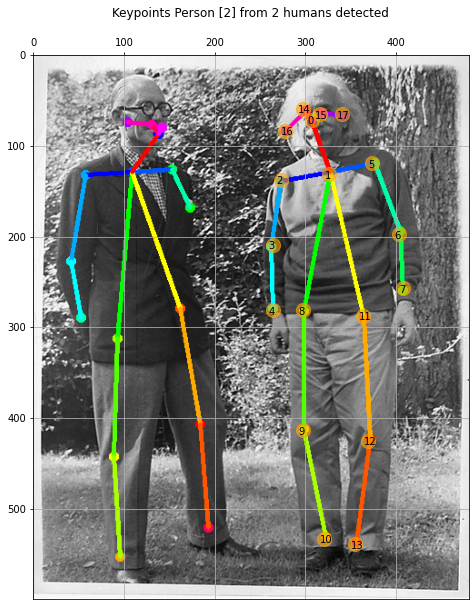

In [85]:
keypoints_2 = show_keypoints(img, hum, 2)

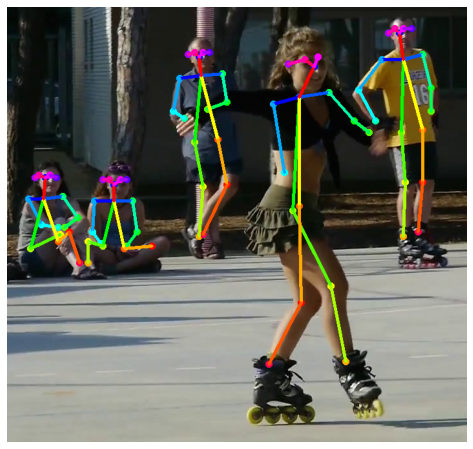

In [86]:
image_path = './images/ski.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=False)

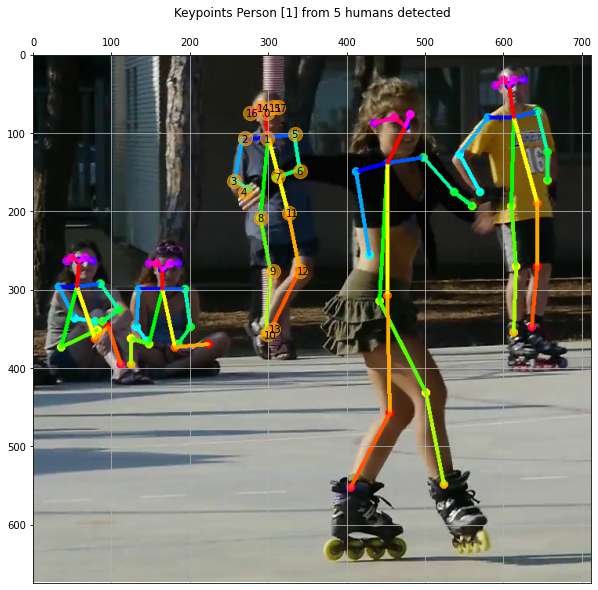

In [87]:
keypoints_1 = show_keypoints(img, hum, 1)

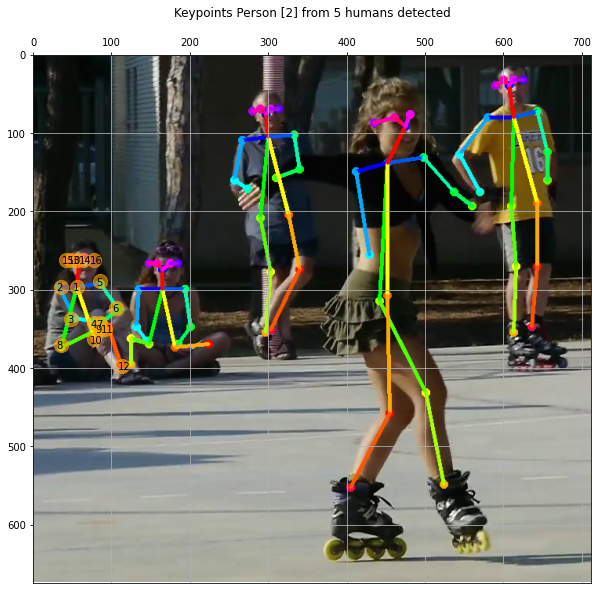

In [88]:
keypoints_2 = show_keypoints(img, hum, 2)

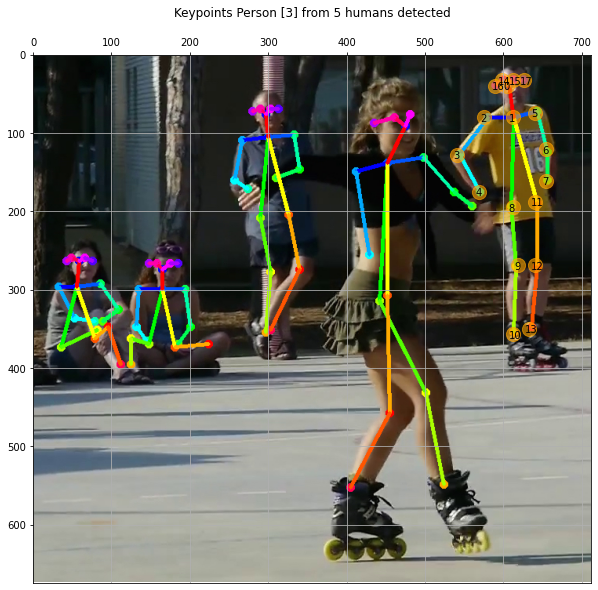

In [89]:
keypoints_3 = show_keypoints(img, hum, 3)

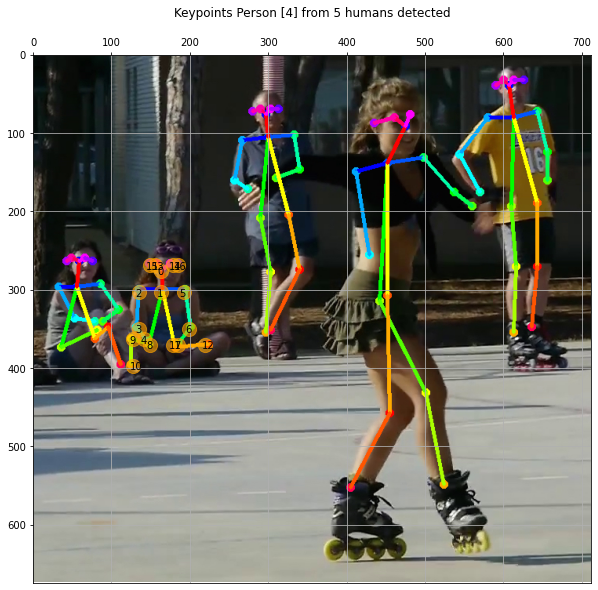

In [90]:
keypoints_4 = show_keypoints(img, hum, 4)

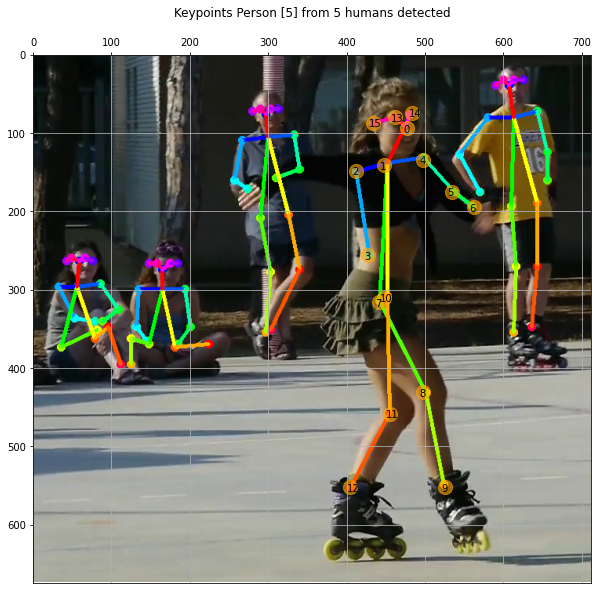

In [91]:
keypoints_5 = show_keypoints(img, hum, 5)

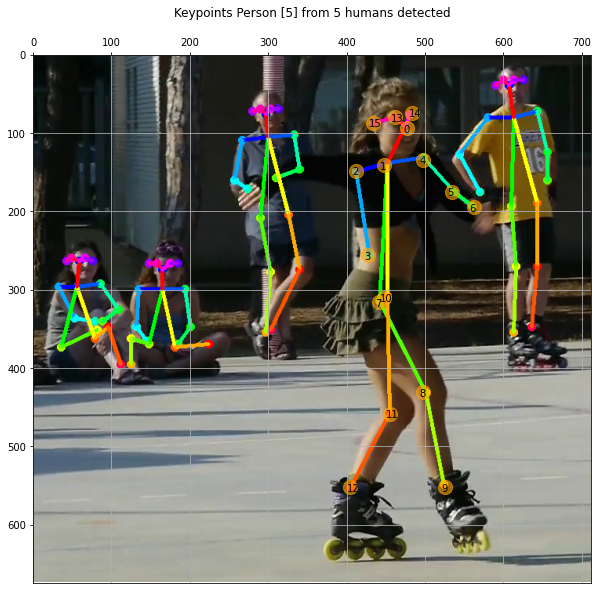

In [92]:
keypoints_5 = show_keypoints(img, hum, 5)

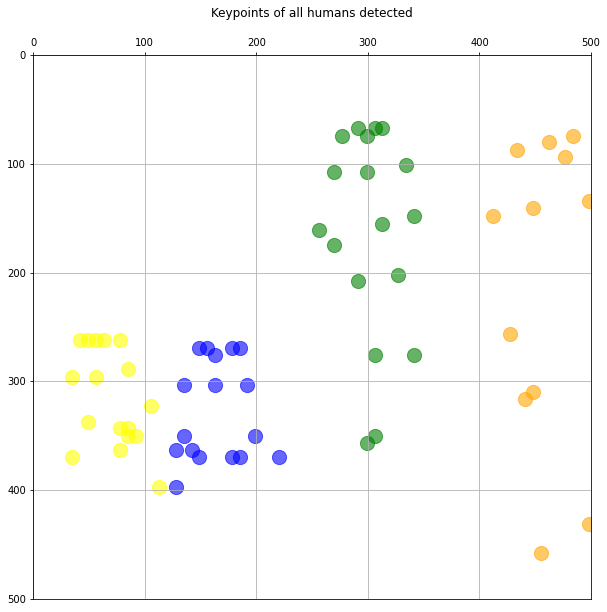

In [93]:
plt.figure(figsize=(10,10))
plt.axis([0, image.shape[1], 0, image.shape[0]])  
plt.scatter(*zip(*keypoints_1), s=200, color='green', alpha=0.6)
plt.scatter(*zip(*keypoints_2), s=200, color='yellow', alpha=0.6)
plt.scatter(*zip(*keypoints_3), s=200, color='red', alpha=0.6)
plt.scatter(*zip(*keypoints_4), s=200, color='blue', alpha=0.6)
plt.scatter(*zip(*keypoints_5), s=200, color='orange', alpha=0.6)
ax=plt.gca() 
ax.set_ylim(ax.get_ylim()[::-1]) 
ax.xaxis.tick_top() 
plt.title('Keypoints of all humans detected\n')
plt.grid();

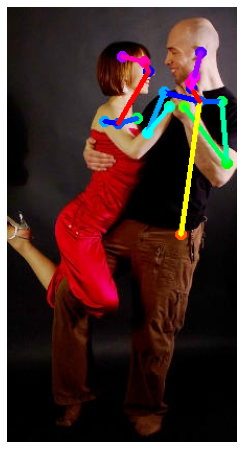

In [95]:
image_path = './images/tango.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=False)

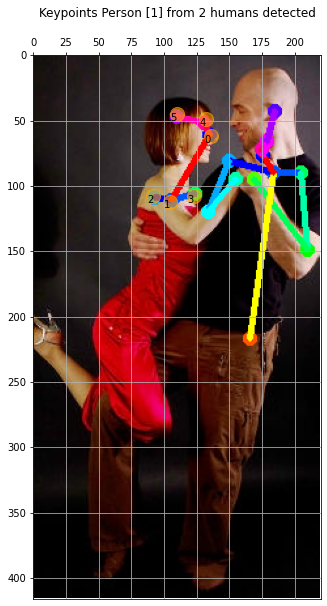

In [96]:
keypoints_1 = show_keypoints(img, hum, 1)

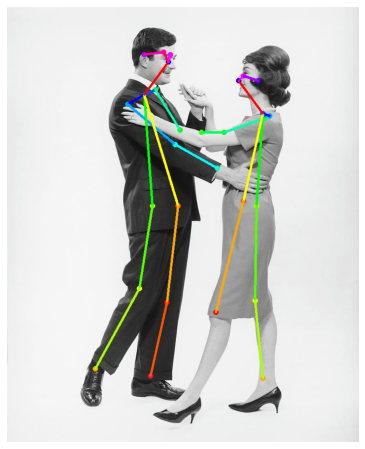

In [98]:
image_path = './images/couple-dancing.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=False)

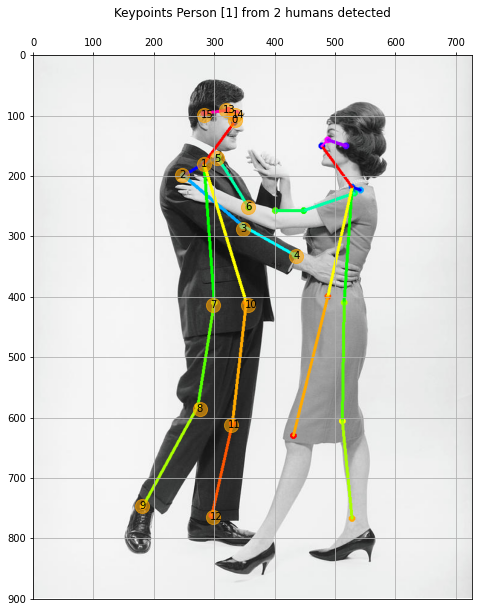

In [100]:
image_path = './images/couple-dancing.jpg'
img, hum = get_human_pose(image_path)
keypoints_1 = show_keypoints(img, hum, 1)

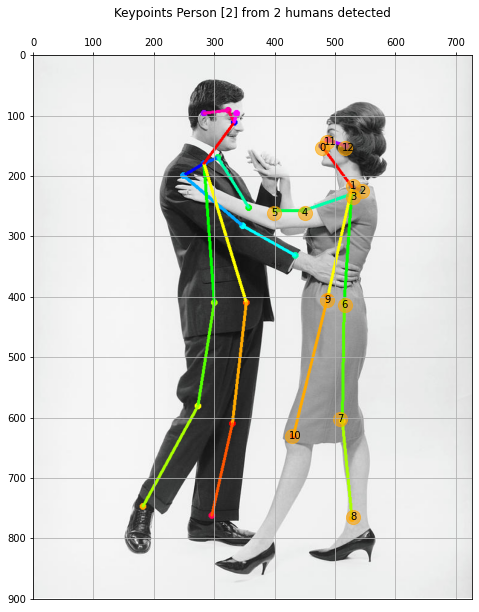

In [101]:
keypoints_2 = show_keypoints(img, hum, 2)

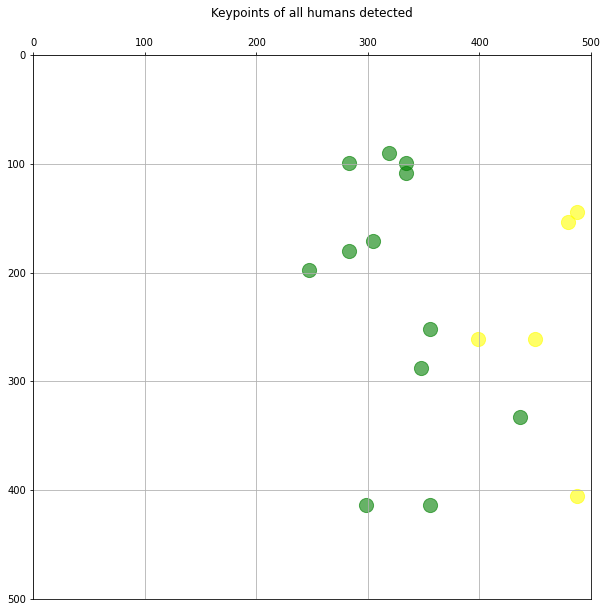

In [102]:
plt.figure(figsize=(10,10))
plt.axis([0, image.shape[1], 0, image.shape[0]])  
plt.scatter(*zip(*keypoints_1), s=200, color='green', alpha=0.6)
plt.scatter(*zip(*keypoints_2), s=200, color='yellow', alpha=0.6)
ax=plt.gca() 
ax.set_ylim(ax.get_ylim()[::-1]) 
ax.xaxis.tick_top() 
plt.title('Keypoints of all humans detected\n')
plt.grid();

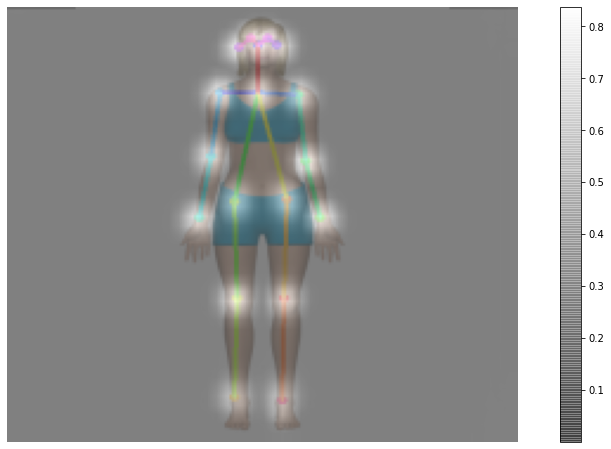

In [103]:
image_path = './images/human.png'
img, hum = get_human_pose(image_path)
show_heatmap(img)

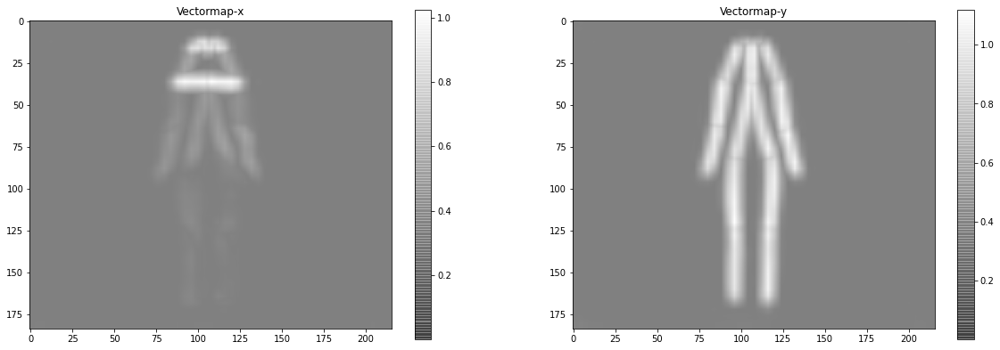

In [104]:
show_vectormaps(img)

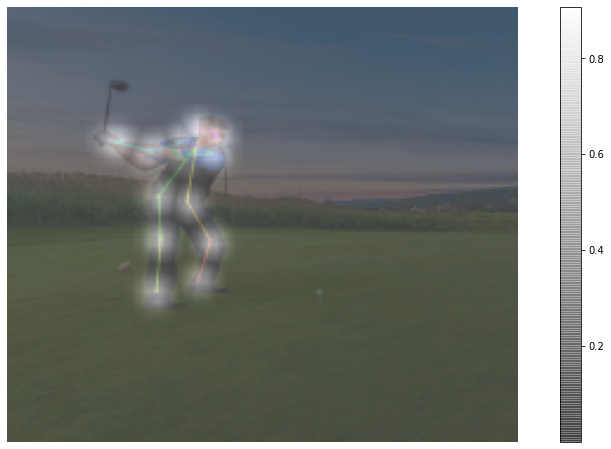

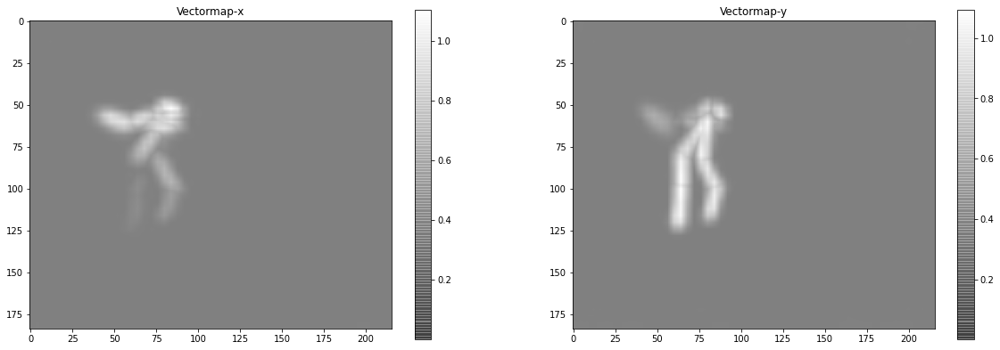

In [105]:
image_path = './images/golf.jpg'
img, hum = get_human_pose(image_path)
show_heatmap(img)
show_vectormaps(img)

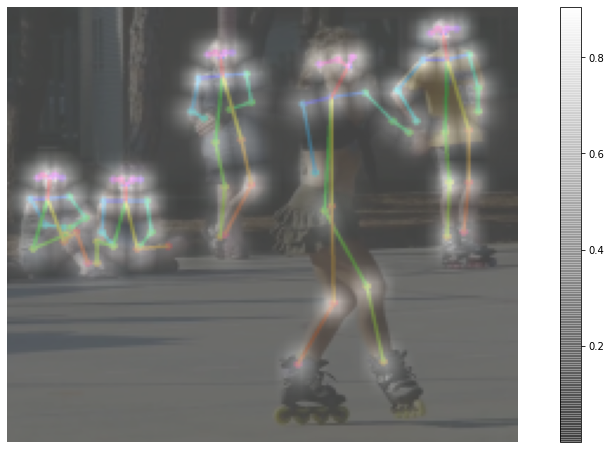

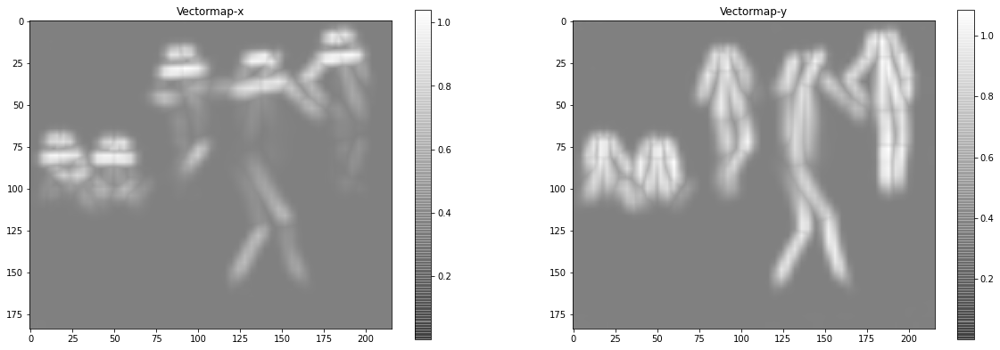

In [106]:
image_path = './images/ski.jpg'
img, hum = get_human_pose(image_path)
show_heatmap(img)
show_vectormaps(img)

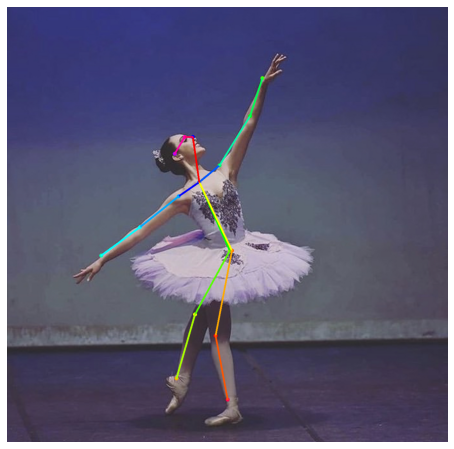

In [113]:
image_path = './images/IMG_6747.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=False)

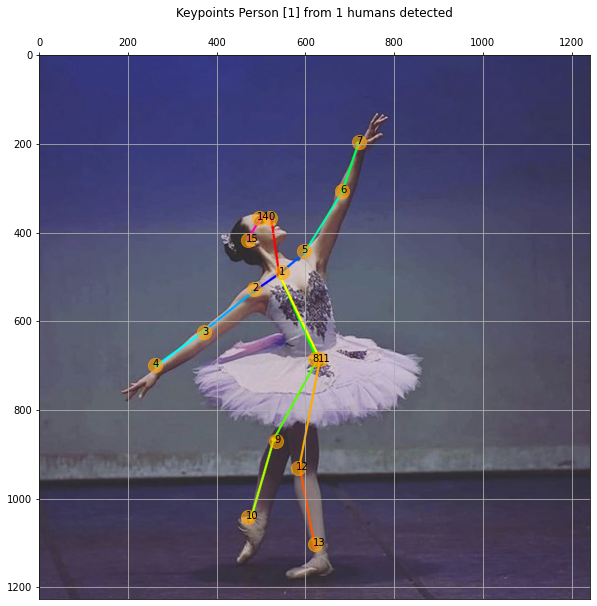

In [114]:
_ = show_keypoints(img, hum)

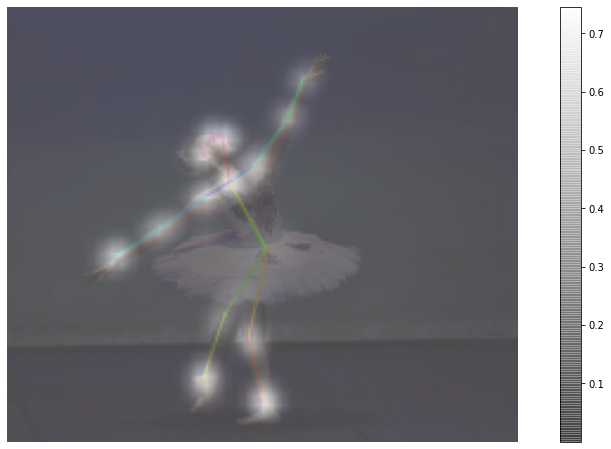

In [115]:
show_heatmap(img)

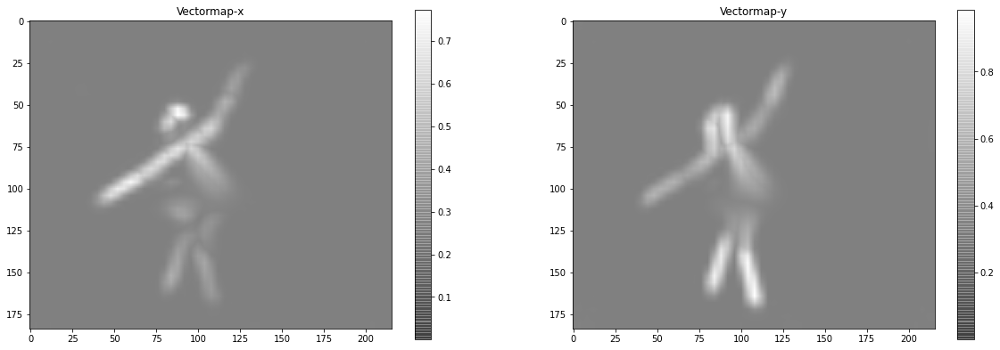

In [116]:
show_vectormaps(img)

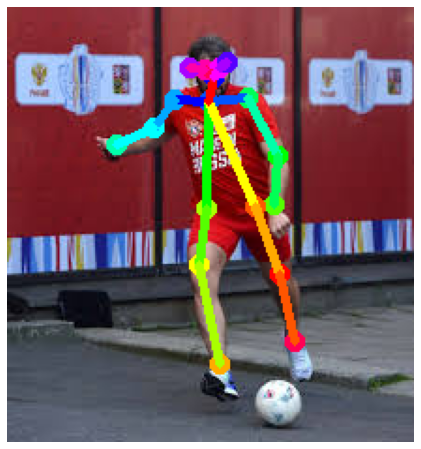

In [124]:
image_path = './images/p1.jpg'
img, hum = get_human_pose(image_path)
plot_img(img, axis=False)